<div style="border: 2px solid red; padding: 10px; border-radius: 5px;">
<strong>Notebook description:</strong>
    
Plotting CellROX results on iNs

<strong>Input Data:</strong>

`030625-Cellrox/.` 


<strong>Figures:</strong>

`Fig3`
`Fig4`

<strong>Last Run All:</strong>
June 18, 2025


In [1]:
import sys
sys.path.append('/Users/djuna/Documents/ABCA7lof2/')

from ABCA7lof2.utils import apply_custom_plot_style
apply_custom_plot_style()

In [2]:
from aicsimageio import AICSImage
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import ttest_ind
import seaborn as sns
import os
import numpy as np
from statannotations.Annotator import Annotator
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import numpy as np


def load_image(path):
    img = AICSImage(path)
    return int_to_float(img.data[0][0][0])

def list_files_in_folder(folder_path):
    return os.listdir(folder_path)

def int_to_float(out):
    """
    Convert image data from integer to float format.

    Parameters:
    - out (np.ndarray): Input image data in integer format.

    Returns:
    - np.ndarray: Converted image data in float format.
    
    Note:
    If the input data type is 'uint16', the conversion is normalized to the range [0, 1]
    by dividing by ((2**16) - 1). If the input data type is 'uint8', the normalization
    is performed by dividing by ((2**8) - 1), resulting in the range [0, 1].
    """
    if out.dtype=='uint16':
        return out.astype(float)/((2**16)-1)
    elif out.dtype=='uint8':
        return out.astype(float)/((2**8)-1)
    
def get_closest_indices(df, value_col, group_col):
    """
    For each group in group_col, return the index of the row where the value in value_col
    is closest to the group's mean value.
    
    Parameters:
    - df: pandas DataFrame containing the data.
    - value_col: str, name of the column with numeric values.
    - group_col: str, name of the column to group by.
    
    Returns:
    - List of indices corresponding to the row closest to the group mean for each group.
    """
    indices = []
    for _, group in df.groupby(group_col):
        group_mean = group[value_col].median()
        # Compute the absolute differences from the mean
        diff = (group[value_col] - group_mean).abs()
        # Append the index of the row with the smallest difference
        indices.append(diff.idxmin())
    return indices


def plot_boxplot_by_treatment(d, x_val, y_val, order, pairs, palette, pvalues):
    # Draw the boxplot with a semi-transparent fill (alpha=0.5) applied via boxprops.
    ax = sns.boxplot(
        data=d, 
        x=x_val, 
        y=y_val, 
        palette=palette, 
        order=order, 
        width=0.5, 
       # capsize=0.1, 
        linewidth=1,

        showfliers=False
    )
    # Overlay the stripplot
    sp = sns.stripplot(
        data=d, 
        x=x_val, 
        y=y_val, 
        dodge=False, 
        jitter=0.1, 
        alpha=1,  
        order=order, 
        color='black',
        #palette=palette,
        size=3
    )

    #plt.ylim(0, plt.ylim()[1])
    # Shift the stripplot points slightly to the left.
    shift = 0.4  # Adjust this value as needed
    for i, coll in enumerate(sp.collections):
        # if i == 0:
        #     shift = 0.4
        # elif i == 1:
        #     shift = 0.4
        # elif i == 2:
        #     shift = 0.4
            
        offsets = coll.get_offsets()
        # Subtract from the x-coordinate to move left
        offsets[:, 0] = offsets[:, 0] + shift
        coll.set_offsets(offsets)
    # Add statistical annotations
    annotator = Annotator(ax, pairs, data=d, x=x_val, y=y_val, order=order)
    annotator.configure(text_format='full', loc='outside',line_offset_to_group=10,  # Increases space between the brackets and the plot
    text_offset=5)
    annotator.set_custom_annotations(pvalues)
    annotator.annotate()
    

    plt.xticks(rotation=0)
    plt.xlabel('')

    # Adjust the boxes so that the face remains semi-transparent while the edge is opaque.
    # Try iterating over both ax.artists and ax.patches.
    for patch in ax.patches:
        # Get the current facecolor (an RGBA tuple)
        fc = patch.get_facecolor()
        # Set the facecolor to have your desired alpha (e.g., 0.5)
        patch.set_facecolor((fc[0], fc[1], fc[2], 0.5))
        # Set the edgecolor to the same RGB but fully opaque (alpha=1)
        #patch.set_edgecolor((fc[0], fc[1], fc[2], 1.0))
        patch.set_linewidth(1)

    return ax


load and binarize images

/var/folders/y7/zpj5hbtd2bl78b1t9h2723hw0000gn/T/ipykernel_83615/1365133122.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 4))


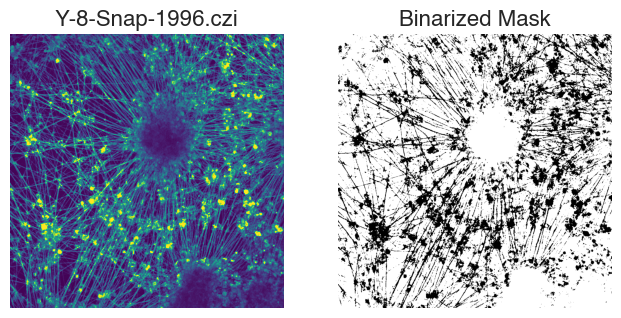

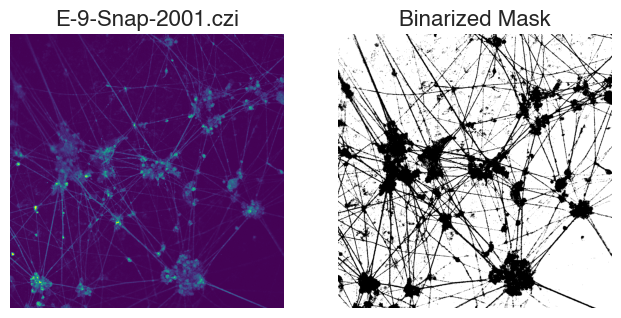

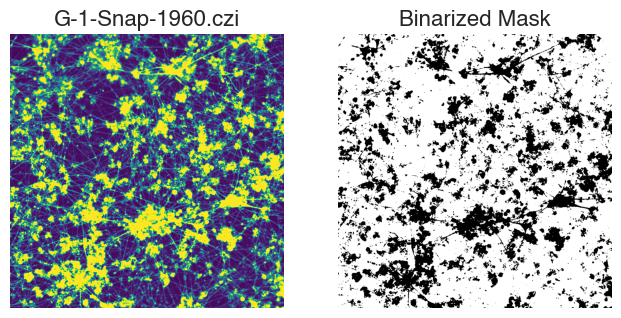

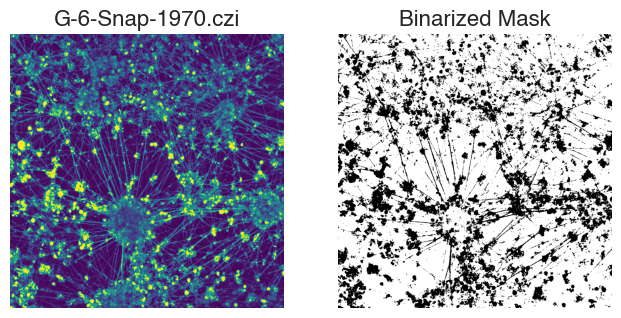

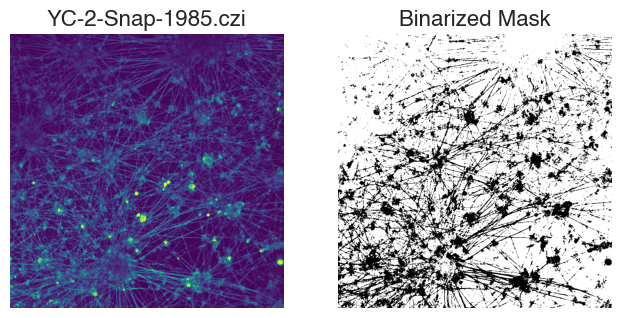

...

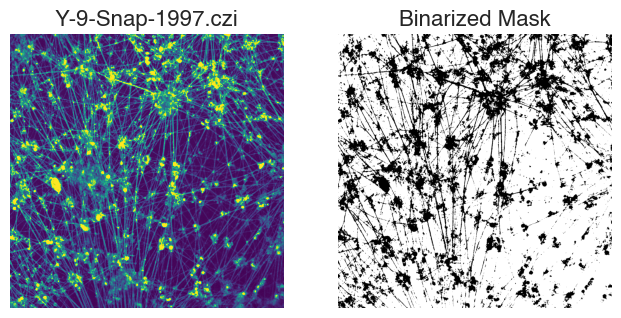

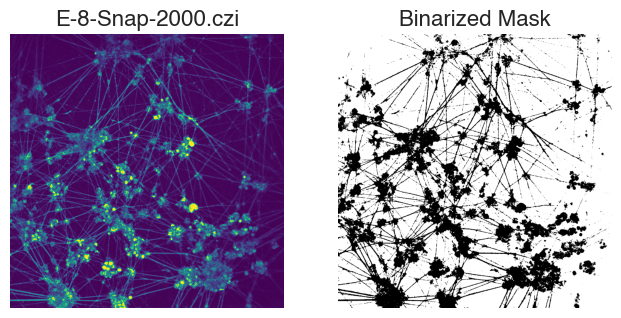

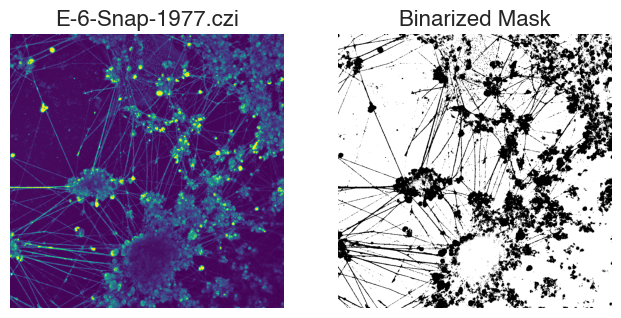

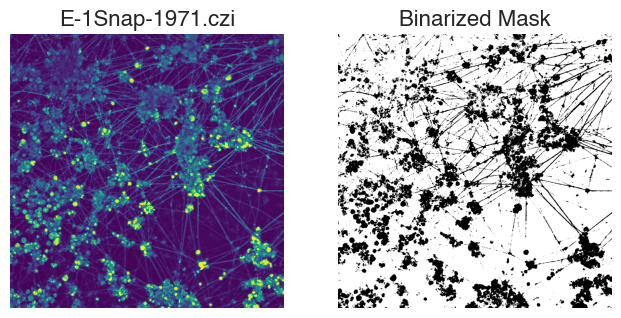

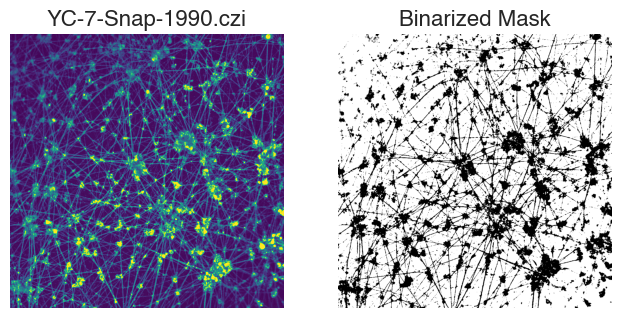

In [3]:
files = list_files_in_folder('../../imaging_data/030625-Cellrox')
values = []
conditions = []
wells = []
for i in files:
    x = load_image(f'../../imaging_data/030625-Cellrox/{i}')
    binarized_mask = x.copy()
    binarized_mask[binarized_mask>np.percentile(binarized_mask, 75)] = 1
    binarized_mask[binarized_mask!=1] = 0
    values.append(np.mean(x[binarized_mask==1]))
    conditions.append(i.split('-')[0].upper())
    wells.append(i.split('-')[1])

    plt.figure(figsize=(12, 4))
    # Show combined image after alignment
    plt.subplot(1, 3, 2)
    plt.imshow(x, vmax=1, cmap='viridis')
    plt.title(i)
    plt.axis('off')  # Remove axes labels, ticks, and numbers

    # Show binarized mask
    plt.subplot(1, 3, 3)
    plt.imshow(binarized_mask, cmap='gray_r')
    plt.title('Binarized Mask')
    plt.axis('off')  # Remove axes labels, ticks, and numbers


In [4]:
# Create a DataFrame from the values, conditions, and wells lists
data = {
    'Value': values,
    'Condition': conditions,
    'Well': wells
}
df = pd.DataFrame(data)

stats

In [5]:
# Do the stats
from scipy.stats import shapiro, levene, ttest_ind

baseline_data = df[(df['Condition']=='E') | (df['Condition']=='Y')]
group1 = baseline_data[baseline_data['Condition'] == 'E']['Value']
group2 = baseline_data[baseline_data['Condition'] == 'Y']['Value']

stat1, p_norm1 = shapiro(group1)
stat2, p_norm2 = shapiro(group2)
print('comparison 1: E vs Y')
print('normality: ', p_norm1)
print('normality:', p_norm2)

stat, p_levene = levene(group1, group2)
# Decide whether to assume equal variances
equal_var = p_levene > 0.05 
print('equal_var:', p_levene)

comparison 1: E vs Y
normality:  0.9075577245795052
normality: 0.7495099056948988
equal_var: 0.5182992281831063


plot panel

/var/folders/y7/zpj5hbtd2bl78b1t9h2723hw0000gn/T/ipykernel_83615/1524710543.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


E vs. Y: p=0.022


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


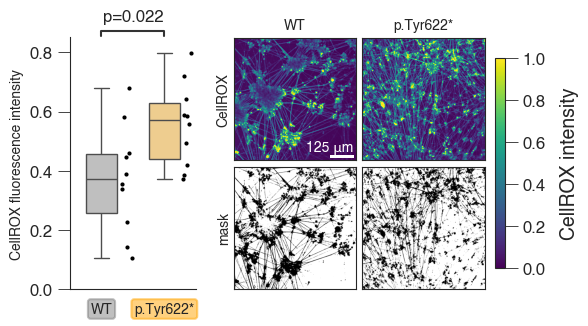

In [6]:
cmap = 'viridis'
# Assuming your data and helper functions (e.g., load_image, plot_boxplot_by_treatment) are already defined
df_sub = df[(df['Condition']=='E') | (df['Condition']=='Y')]

# Create a new figure with a gridspec with 1 row and 2 columns.
fig = plt.figure(figsize=(5, 3))
gs = fig.add_gridspec(1, 2, width_ratios=[0.6, 1.2])  # adjust ratios as needed

# ------------------
# Left: Boxplot panel
# ------------------
ax_box = fig.add_subplot(gs[0])
# (Option 1) If your function does not accept an ax parameter, you can set the current axes:
plt.sca(ax_box)

baseline_data = df[(df['Condition']=='E') | (df['Condition']=='Y')]
group1 = baseline_data[baseline_data['Condition'] == 'E']['Value']
group2 = baseline_data[baseline_data['Condition'] == 'Y']['Value']

t_stat, p_value = ttest_ind(group1, group2, equal_var=True)
formatted_pvalues = [f"p={p:.3f}" if p>0.001 else f"p={p:.3e}" for p in [p_value]]
ax_box = plot_boxplot_by_treatment(df_sub, 'Condition', 'Value', order = ['E', 'Y'], pairs = [('E', 'Y')],palette={'E': 'grey', 'Y': 'orange'}, pvalues=formatted_pvalues)

ax_box.set_ylabel('CellROX fluorescence intensity', fontsize=10)
ax_box.set_xticks([])

# Optionally add your custom x-axis labels to ax_box
ax_box.text(0, -0.05, "WT", ha='center', va='top', 
            transform=ax_box.get_xaxis_transform(),
            bbox=dict(boxstyle="round,pad=0.2", fc="grey", ec="grey", alpha=0.5), 
            fontsize=10)
ax_box.text(1, -0.05, "p.Tyr622*", ha='center', va='top', 
            transform=ax_box.get_xaxis_transform(),
            bbox=dict(boxstyle="round,pad=0.2", fc="orange", ec="orange", alpha=0.5), 
            fontsize=10)

ax_box.spines['top'].set_visible(False)
ax_box.spines['right'].set_visible(False)
ax_box.set_ylim(0, 0.85)

# ------------------
# Right: Image panel with 2x2 subplots
# ------------------
# Create a nested gridspec for the right panel (2 rows x 2 columns)
gs_right = gs[1].subgridspec(2, 2, wspace=0.05, hspace=0.05)

# Top left image
ax_img1 = fig.add_subplot(gs_right[0, 0])
img1 = load_image('../../imaging_data/030625-Cellrox/E-4-Snap-1975.czi')
# Process image if needed (e.g., create a binarized mask)
binarized_mask_e1 = img1.copy()
binarized_mask_e1[img1 > np.percentile(img1, 75)] = 1
binarized_mask_e1[img1 <= np.percentile(img1, 75)] = 0

ax_img1.imshow(img1, vmin=0, vmax=1, cmap=cmap)
ax_img1.set_title('WT', fontsize=10)
ax_img1.set_xticks([])
ax_img1.set_yticks([])

# Top right image
ax_img2 = fig.add_subplot(gs_right[0, 1])
img2 = load_image('../../imaging_data/030625-Cellrox/Y-9-Snap-1997.czi')
ax_img2.imshow(img2, vmin=0, vmax=1, cmap=cmap)
ax_img2.set_title('p.Tyr622*', fontsize=10)
ax_img2.set_xticks([])
ax_img2.set_yticks([])

# Process image if needed (e.g., create a binarized mask)
binarized_mask_y9 = img2.copy()
binarized_mask_y9[img2 > np.percentile(img2, 75)] = 1
binarized_mask_y9[img2 <= np.percentile(img2, 75)] = 0

# Bottom left image
ax_img3 = fig.add_subplot(gs_right[1, 0])
ax_img3.imshow(binarized_mask_e1, cmap='gray_r')
ax_img3.set_xticks([])
ax_img3.set_yticks([])

# Bottom left image
ax_img4 = fig.add_subplot(gs_right[1, 1])
ax_img4.imshow(binarized_mask_y9, cmap='gray_r')
ax_img4.set_xticks([])
ax_img4.set_yticks([])

ax_img1.set_ylabel('CellROX', rotation=90, fontsize=10, labelpad=2)
ax_img3.set_ylabel('mask', rotation=90, fontsize=10, labelpad=2)

# Optionally add a colorbar to the right of the image panel
norm = plt.Normalize(vmin=0, vmax=1)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label(r'CellROX intensity', labelpad=10)

# ------------------
# Final adjustments and save
# ------------------
#fig.suptitle('ABCA7 p.Tyr622*', fontsize=10, y=1.)  # Title spanning both panels

# # Add single bar and title spanning both columns
# fig.text(0.65, 1.03, 'ABCA7 p.Tyr622*', horizontalalignment='center', fontsize=10)

# # Add vertical bar above spanning both columns
# bar_width = 5
# bar_y = 1
# fig.add_artist(plt.Line2D([0.41, 0.89], [bar_y, bar_y], color='black', transform=fig.transFigure))


# plt.subplots_adjust(left=0.07, right=0.9, top=0.92, bottom=0.08)
# add scale bar 
import matplotlib.patches as patches

# Assume the image dimensions in out_fppc[0] (height, width)
img_height, img_width = binarized_mask_y9.shape
bar_length = 200    # scale bar length in pixels (adjust as needed)
bar_height = 20     # thickness of the scale bar in pixels

# Position the scale bar in the lower right corner with some margin
margin = 20
x_start = img_width - bar_length - margin
y_start = img_height - margin

# Create a white rectangle for the scale bar
scale_bar = patches.Rectangle((x_start, y_start - bar_height), bar_length, bar_height, 
                               linewidth=0, edgecolor=None, facecolor='white')
ax_img1.add_patch(scale_bar)

img = AICSImage('../../imaging_data/030625-Cellrox/Y-9-Snap-1997.czi')
# Add a text label above the scale bar (centered)
ax_img1.text(x_start, y_start-150, f'{bar_length * img.physical_pixel_sizes[1]:.0f} μm', 
                color='white', ha='center', va='top', fontsize=10)

#plt.savefig('../../paper/main_plots/tmrm_choline.png', dpi=300, bbox_inches='tight')
plt.subplots_adjust(left=0.07, right=0.9, top=0.92, bottom=0.08)
plt.savefig('/Users/djuna/Documents/ABCA7lof2/editorial_paper/main_panels_svgs/fig3/cellrox_images.pdf', dpi=300, bbox_inches='tight')
plt.show()


save source data

In [7]:
dictionary = {'Y':'p.Tyr622* + H20', 'YC':'p.Tyr622* + CDP-choline'}
df_sub['Condition'] = df_sub['Condition'].map(dictionary)
df_sub.columns = ['CellROX intensity', 'Condition', 'Well']
df_sub.to_csv('/Users/djuna/Documents/ABCA7lof2/editorial_paper/source_data/fig3/cellrox_intensity_data.csv', index=False)

/var/folders/y7/zpj5hbtd2bl78b1t9h2723hw0000gn/T/ipykernel_83615/3558301513.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sub['Condition'] = df_sub['Condition'].map(dictionary)


stats

In [8]:
# Do the stats
from scipy.stats import shapiro, levene, ttest_ind

baseline_data = df[(df['Condition']=='YC') | (df['Condition']=='Y')]
group1 = baseline_data[baseline_data['Condition'] == 'YC']['Value']
group2 = baseline_data[baseline_data['Condition'] == 'Y']['Value']

stat1, p_norm1 = shapiro(group1)
stat2, p_norm2 = shapiro(group2)
print('comparison 1: YC vs Y')
print('normality: ', p_norm1)
print('normality:', p_norm2)

stat, p_levene = levene(group1, group2)
# Decide whether to assume equal variances
equal_var = p_levene > 0.05 
print('equal_var:', p_levene)

comparison 1: YC vs Y
normality:  0.15973918081481653
normality: 0.7495099056948988
equal_var: 0.8478433242344926


/var/folders/y7/zpj5hbtd2bl78b1t9h2723hw0000gn/T/ipykernel_83615/1524710543.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


Y vs. YC: p=0.011


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


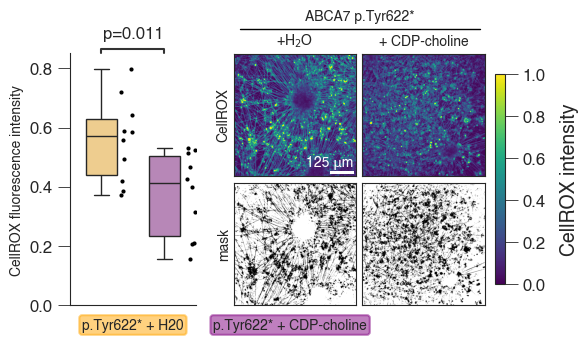

In [9]:
df_sub = df[(df['Condition']=='YC') | (df['Condition']=='Y')]

cmap = 'viridis'

# Assuming your data and helper functions (e.g., load_image, plot_boxplot_by_treatment) are already defined

# Create a new figure with a gridspec with 1 row and 2 columns.
fig = plt.figure(figsize=(5, 3))
gs = fig.add_gridspec(1, 2, width_ratios=[0.6, 1.2])  # adjust ratios as needed

# ------------------
# Left: Boxplot panel
# ------------------
ax_box = fig.add_subplot(gs[0])
# (Option 1) If your function does not accept an ax parameter, you can set the current axes:
plt.sca(ax_box)
baseline_data = df[(df['Condition']=='YC') | (df['Condition']=='Y')]
group1 = baseline_data[baseline_data['Condition'] == 'YC']['Value']
group2 = baseline_data[baseline_data['Condition'] == 'Y']['Value']

t_stat, p_value = ttest_ind(group1, group2, equal_var=True)
formatted_pvalues = [f"p={p:.3f}" if p>0.001 else f"p={p:.3e}" for p in [p_value]]

ax_box = plot_boxplot_by_treatment(df_sub, 'Condition', 'Value', order = ['Y', 'YC'], pairs = [('Y', 'YC')],palette={'Y': 'orange', 'YC': 'purple'}, pvalues=formatted_pvalues)

ax_box.set_ylabel('CellROX fluorescence intensity', fontsize=10)
ax_box.set_xticks([])

# Optionally add your custom x-axis labels to ax_box
ax_box.text(0.5, -0.05, "p.Tyr622* + H20", ha='center', va='top', 
            transform=ax_box.get_xaxis_transform(),
            bbox=dict(boxstyle="round,pad=0.2", fc="orange", ec="orange", alpha=0.5), 
            fontsize=10)
ax_box.text(3, -0.05, "p.Tyr622* + CDP-choline", ha='center', va='top', 
            transform=ax_box.get_xaxis_transform(),
            bbox=dict(boxstyle="round,pad=0.2", fc="purple", ec="purple", alpha=0.5), 
            fontsize=10)

ax_box.spines['top'].set_visible(False)
ax_box.spines['right'].set_visible(False)
ax_box.set_ylim(0, 0.85)

# ------------------
# Right: Image panel with 2x2 subplots
# ------------------
# Create a nested gridspec for the right panel (2 rows x 2 columns)
gs_right = gs[1].subgridspec(2, 2, wspace=0.05, hspace=0.05)

# Top left image
ax_img1 = fig.add_subplot(gs_right[0, 0])
img1 = load_image('../../imaging_data/030625-Cellrox/Y-8-Snap-1996.czi')
# Process image if needed (e.g., create a binarized mask)
binarized_mask_e1 = img1.copy()
binarized_mask_e1[img1 > np.percentile(img1, 75)] = 1
binarized_mask_e1[img1 <= np.percentile(img1, 75)] = 0

ax_img1.imshow(img1, vmin=0, vmax=1, cmap=cmap)
ax_img1.set_title('+H$_2$O', fontsize=10)
ax_img1.set_xticks([])
ax_img1.set_yticks([])

# Top right image
ax_img2 = fig.add_subplot(gs_right[0, 1])
img2 = load_image('../../imaging_data/030625-Cellrox/YC-1-Snap-1984.czi')
ax_img2.imshow(img2, vmin=0, vmax=1, cmap=cmap)
ax_img2.set_title('+ CDP-choline', fontsize=10)
ax_img2.set_xticks([])
ax_img2.set_yticks([])

# Process image if needed (e.g., create a binarized mask)
binarized_mask_y9 = img2.copy()
binarized_mask_y9[img2 > np.percentile(img2, 75)] = 1
binarized_mask_y9[img2 <= np.percentile(img2, 75)] = 0

# Bottom left image
ax_img3 = fig.add_subplot(gs_right[1, 0])
ax_img3.imshow(binarized_mask_e1, cmap='gray_r')
ax_img3.set_xticks([])
ax_img3.set_yticks([])

# Bottom left image
ax_img4 = fig.add_subplot(gs_right[1, 1])
ax_img4.imshow(binarized_mask_y9, cmap='gray_r')
ax_img4.set_xticks([])
ax_img4.set_yticks([])

ax_img1.set_ylabel('CellROX', rotation=90, fontsize=10, labelpad=2)
ax_img3.set_ylabel('mask', rotation=90, fontsize=10, labelpad=2)

# Optionally add a colorbar to the right of the image panel
norm = plt.Normalize(vmin=0, vmax=1)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label(r'CellROX intensity', labelpad=10)

# ------------------
# Final adjustments and save
# ------------------
#fig.suptitle('ABCA7 p.Tyr622*', fontsize=10, y=1.)  # Title spanning both panels

# # Add single bar and title spanning both columns
# fig.text(0.65, 1.03, 'ABCA7 p.Tyr622*', horizontalalignment='center', fontsize=10)

# # Add vertical bar above spanning both columns
# bar_width = 5
# bar_y = 1
# fig.add_artist(plt.Line2D([0.41, 0.89], [bar_y, bar_y], color='black', transform=fig.transFigure))

# Add single bar and title spanning both columns
fig.text(0.65, 1.03, 'ABCA7 p.Tyr622*', horizontalalignment='center', fontsize=10)

# Add vertical bar above spanning both columns
bar_width = 5
bar_y = 1
fig.add_artist(plt.Line2D([0.41, 0.89], [bar_y, bar_y], color='black', transform=fig.transFigure))

import matplotlib.patches as patches

# Assume the image dimensions in out_fppc[0] (height, width)
img_height, img_width = binarized_mask_y9.shape
bar_length = 200    # scale bar length in pixels (adjust as needed)
bar_height = 20     # thickness of the scale bar in pixels

# Position the scale bar in the lower right corner with some margin
margin = 20
x_start = img_width - bar_length - margin
y_start = img_height - margin

# Create a white rectangle for the scale bar
scale_bar = patches.Rectangle((x_start, y_start - bar_height), bar_length, bar_height, 
                               linewidth=0, edgecolor=None, facecolor='white')
ax_img1.add_patch(scale_bar)

img = AICSImage('../../imaging_data/030625-Cellrox/Y-9-Snap-1997.czi')
# Add a text label above the scale bar (centered)
ax_img1.text(x_start, y_start-150, f'{bar_length * img.physical_pixel_sizes[1]:.0f} μm', 
                color='white', ha='center', va='top', fontsize=10)

# plt.subplots_adjust(left=0.07, right=0.9, top=0.92, bottom=0.08)

#plt.savefig('../../paper/main_plots/tmrm_choline.png', dpi=300, bbox_inches='tight')
plt.subplots_adjust(left=0.07, right=0.9, top=0.92, bottom=0.08)
plt.savefig('/Users/djuna/Documents/ABCA7lof2/editorial_paper/main_panels_svgs/fig4/cellrox_images_choline.pdf', dpi=300, bbox_inches='tight')
plt.show()


Save source data

In [10]:
dictionary = {'Y':'p.Tyr622* + H20', 'YC':'p.Tyr622* + CDP-choline'}
df_sub['Condition'] = df_sub['Condition'].map(dictionary)
df_sub.columns = ['CellROX intensity', 'Condition', 'Well']
df_sub.to_csv('/Users/djuna/Documents/ABCA7lof2/editorial_paper/source_data/fig4/cellrox_intensity_data.csv', index=False)

/var/folders/y7/zpj5hbtd2bl78b1t9h2723hw0000gn/T/ipykernel_83615/1735937758.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sub['Condition'] = df_sub['Condition'].map(dictionary)


Viewing all images

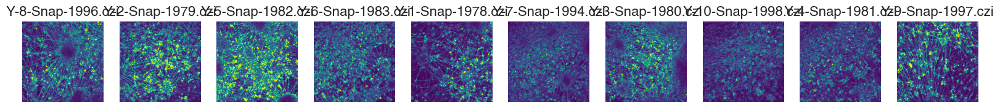

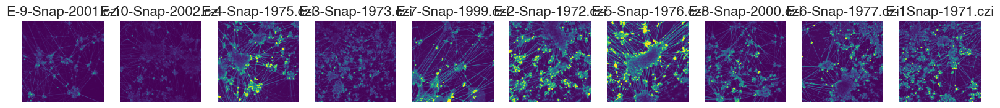

In [11]:
import matplotlib.pyplot as plt

# Load images from folder and show side by side
folder_path = '../../imaging_data/030625-Cellrox/'
files = np.array(list_files_in_folder(folder_path))[np.array(conditions)=='Y']
images = [load_image(f'{folder_path}/{file}') for file in files]

plt.figure(figsize=(20, 10))
for i, img in enumerate(images):
    plt.subplot(1, len(images), i + 1)
    plt.imshow(img, cmap='viridis', vmax=1)
    plt.title(files[i])
    plt.axis('off')
plt.show()

# Load images from folder and show side by side
folder_path = '../../imaging_data/030625-Cellrox/'
files = np.array(list_files_in_folder(folder_path))[np.array(conditions)=='E']
images = [load_image(f'{folder_path}/{file}') for file in files]

plt.figure(figsize=(20, 10))
for i, img in enumerate(images):
    plt.subplot(1, len(images), i + 1)
    plt.imshow(img, cmap='viridis', vmax=1)
    plt.title(files[i])
    plt.axis('off')
plt.show()